## Part I  
Import necessary libraries and parse the Sentinel 5 NO2 files.  
Files are in .nc format which can be downloaded from sentinelhub or AWS s3 bucket.  
### Import libraries

In [1]:
import os
import pandas as pd
import netCDF4 as nc4
import matplotlib.pyplot as plt
from netCDF4 import Dataset
import numpy as np
import folium as folium
from folium.plugins import HeatMapWithTime
import geopandas as gpd
from datetime import date
from folium.features import GeoJsonTooltip
import datetime
from shapely.geometry import Point

# variables to return choropleth map (single day)
selected_day = '2022-11-24' # random day of the year
multiplication_factor = 100000 # to scale s5 data for folium map
init_day = date(2022, 10, 3) # first day for which we have data

### Parse nc files
Let's select the columns of interest and create a data frame

In [ ]:
def create_no2_df(file):
    # read nc file using netcdf package
    fh = Dataset(file, mode='r')
    # sentinel 5P product parsing
    lons = fh.groups['PRODUCT'].variables['longitude'][:].flatten()
    lats = fh.groups['PRODUCT'].variables['latitude'][:].flatten()
    # ancillary_variables: nitrogendioxide_tropospheric_column_precision air_mass_factor_troposphere air_mass_factor_total averaging_kernel
    # multiplication_factor_to_convert_to_molecules_percm2: 6.02214e+19
    no2_tropo_col = fh.groups['PRODUCT'].variables['nitrogendioxide_tropospheric_column'][0,:,:].flatten()
    no2_measure = fh.groups['PRODUCT'].variables['nitrogendioxide_tropospheric_column_precision'][0,:,:].flatten()
    air_mass_factor = fh.groups['PRODUCT'].variables['air_mass_factor_troposphere'][:].flatten()
    # naming convention is stationary
    sensing_time = file[-18:-10]
    # convert to df that we will append to the file later on
    df = pd.DataFrame([], columns=['lon', 'lat', 'time', 'no2_tropo', 'no2_prec', 'air_mass_f'])
    df['lon'] = lons
    df['lat'] = lats
    df['time'] = sensing_time
    df['no2_tropo'] = no2_tropo_col
    df['no2_prec'] = no2_measure
    df['air_mass_f'] = air_mass_factor
    df = df[df.no2_tropo.notna()]
    df['lat'] = df['lat'].astype(float)
    df['lon'] = df['lon'].astype(float)
    # limit the area since sent 5 images are extra large, keep in mind that stallite orbits are changing
    df = df[df['lon'].between(10, 30) & df['lat'].between(48, 60)] # taking area neighbouring to Lithuania
    return df



In [ ]:
# create a list of nc files in the directory
folder = 'no2 files'
files = []
for dirpath,_,filenames in os.walk(folder):
    for f in filenames:
        tmp_path = os.path.join(folder, f)
        files.append(tmp_path)

In [ ]:
# if it is not an update, for the first iteration you should create a new df object
cols = ['lon', 'lat', 'time', 'no2_tropo', 'no2_prec', 'air_mass_f']
df = pd.DataFrame([], columns=cols)
# since I have some data already, I can just read and update the dataframe
# df = pd.read_csv('NO2_matavimai.csv')[cols]

In [ ]:
# loop through file list and create/update Sentinel 5 NO2 data
for name in files:
    if name.endswith('.nc'):
        temp = create_no2_df(name)
        df = pd.concat([df, temp])
    else:
        pass
df['time'] = pd.to_datetime(df.time)

In [ ]:
# save the results
df.to_csv('no2_1001_0228_pagal_s5.csv', encoding='utf-8')

## Part II - filtering Lithuania  
Here I will create a subset of the data that contains Lithuania points only. For that I will check each point individually and assign a polygon.   Objective is to find average NO2 value per municipality so we could see which part of Lithuania is more contaminated.


In [ ]:
# use the data created above
df = pd.read_csv('no2_1001_0228_pagal_s5.csv')

In [46]:
# Import municipality polygon data and read the geoJSON file using geopandas.
geojson = gpd.read_file(r'municipalities.geojson')
geojson = geojson[['name','geometry']]
geojson = geojson[geojson.name.notna()]

In [ ]:
def find_municipality(data, geojson):
    ''' 
    Using a pre-defined geojson file find to which municipality the data point belongs to. 
    Inputs: 
        data (must have cols ['lat', 'lon'])
        geojson (must have geometry col (polygon))
    Returns:
        new column []'savivaldybes_pav']
    '''
    df = data.copy()
    df['savivaldybes_pav'] = None
    df.reset_index(inplace=True)
    # check if the point belongs to a polygon and return the name of the polygon in a new column
    for pt in range(len(df)):
        point = Point(df.lon.iloc[pt], df.lat.iloc[pt])
        for plg in range(len(geojson)):
            polygon = geojson.geometry.iloc[plg]
            if polygon.contains(point):
                df['savivaldybes_pav'].iloc[pt] = geojson.name.iloc[plg]
            else:
                pass
    return df

In [ ]:
lt_only = find_municipality(df)
lt_only = lt_only[lt_only.savivaldybes_pav.notna()][['lon','lat','savivaldybes_pav']]

In [ ]:
lt_only.head()

In [ ]:
df = df.merge(lt_only,
               left_on=['lon','lat'], right_on=['lon','lat'], how='left')
# dienos_duomenys.head()

In [ ]:
# create a new dataframe that only contains the values of interest
df = pd.DataFrame(df[df.savivaldybes_pav.notna()].reset_index()[cols + ['savivaldybes_pav']])

In [16]:
for i in range(len(df.time)):
    df.time[i] = datetime.datetime.strptime(str(df.time[i]), '%Y%m%d').strftime('%Y-%m-%d')

/var/folders/jc/0m_v96ps7h12t3pj03psgnwr0000gn/T/ipykernel_62562/1239899726.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.time[i] = datetime.datetime.strptime(str(df.time[i]), '%Y%m%d').strftime('%Y-%m-%d')


In [ ]:
# save the results
df.to_csv('no2_LT_1001_0228.csv', encoding='utf-8')


## Part III - visuals

Creates a visual representation of data. Will be displayed on the map, using folium. 

### Heatmap With Time

In [ ]:
# filter the points 
# test_lietuvai = pd.DataFrame(lt_only[lt_only.savivaldybes_pav.notna()].reset_index()[cols + ['savivaldybes_pav']])
# test_lietuvai.head()

In [13]:
df = pd.read_csv('no2_LT_1001_0228.csv') #[['lon', 'lat', 'time', 'no2_tropo']]

In [38]:
df.head(5)

,Unnamed: 0,lon,lat,time,no2_tropo,no2_prec,air_mass_f,savivaldybes_pav
0,0,24.347162,53.902908,2022-10-03,0.000018,0.000011,1.404206,Varėnos rajono savivaldybė
1,1,23.611698,53.935265,2022-10-03,0.000014,0.000010,1.370443,Lazdijų rajono savivaldybė
2,2,23.813217,53.940495,2022-10-03,0.000029,0.000013,1.230075,Lazdijų rajono savivaldybė
3,3,24.018717,53.945309,2022-10-03,0.000015,0.000011,1.313799,Druskininkų savivaldybė
4,4,24.228365,53.949684,2022-10-03,0.000018,0.000011,1.397629,Varėnos rajono savivaldybė


In [ ]:
tik_lt = folium.Map([55, 23], zoom_start=6, overlay=True )

# heatmap_time_dates = [d.strftime('%Y-%m-%d') for d in pd.date_range(init_day, periods=len(df.groupby('time')))]
heatmap_time_dates = df.time.unique().tolist()
data = []
for _, d in df[['lon', 'lat', 'time', 'no2_tropo']].groupby('time'):
    data.append([[row['lat'], row['lon'], row['no2_tropo']] for _, row in d.iterrows()])

# custom_scale = (data.no2_tropo.quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
hm = HeatMapWithTime(data, 
                     index=heatmap_time_dates, 
                     name='NO2 Lapkritis', 
                     radius=50, # sentinel 5 resolution is 7m x 7m
                     auto_play=True,
                     min_opacity = 0.15, 
                     max_opacity=0.9, 
                     gradient = 'red')

hm.add_to(tik_lt)
tik_lt

In [ ]:
tik_lt.save("tik_lt_lapkritis_NO2.html")

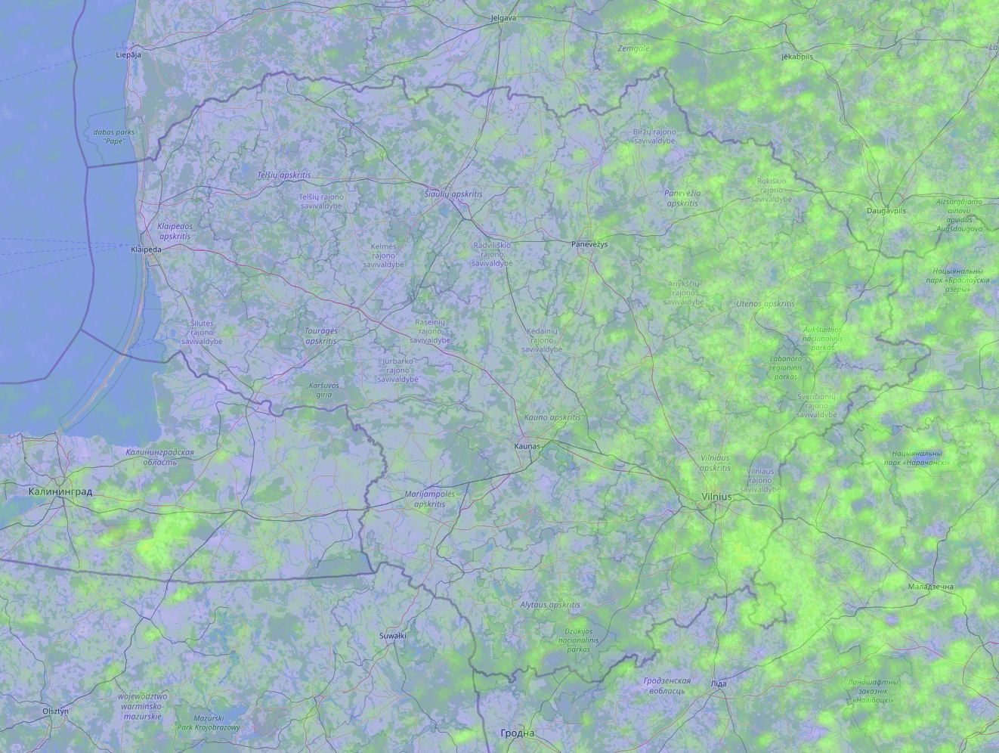

### Choropleth
Part where I create a choropleth visualization for a single day :: `selected_day`.

In [45]:
dienos_duomenys = pd.DataFrame(df[df['time'] == '2022-11-24'].drop(['lat','lon','Unnamed: 0'], axis =1).groupby(['savivaldybes_pav']).mean().reset_index())
dienos_duomenys = dienos_duomenys.rename({'savivaldybes_pav': 'name'}, axis=1)
dienos_duomenys.no2_tropo *= multiplication_factor
dienos_duomenys.head()

,name,no2_tropo,no2_prec,air_mass_f
0,Akmenės rajono savivaldybė,0.000040,0.000035,0.807648
1,Alytaus miesto savivaldybė,0.000050,0.000051,0.479789
2,Alytaus rajono savivaldybė,0.000055,0.000052,0.475083
3,Anykščių rajono savivaldybė,0.000061,0.000053,0.507205
4,Birštono savivaldybė,0.000081,0.000061,0.438724


In [23]:
geojson['day'] = selected_day
geojson = geojson.merge(dienos_duomenys[['name','no2_tropo']],
               left_on='name', right_on='name', how='left')

In [43]:
geojson.head()

,name,geometry,day,no2_tropo
0,Visagino savivaldybė,"POLYGON ((26.40130 55.59647, 26.39376 55.59118...",2022-11-24,3.108155
1,Ignalinos rajono savivaldybė,"POLYGON ((26.12098 55.29337, 26.12140 55.29354...",2022-11-24,3.823123
2,Zarasų rajono savivaldybė,"POLYGON ((26.25780 55.78338, 26.24810 55.79356...",2022-11-24,4.166093
3,Vilkaviškio rajono savivaldybė,"POLYGON ((22.70215 54.47372, 22.70240 54.47244...",2022-11-24,4.910135
4,Šakių rajono savivaldybė,"POLYGON ((23.41634 54.95543, 23.44382 54.97716...",2022-11-24,4.281906


In [32]:
my_map = folium.Map([55, 23], zoom_start=6, overlay=True )

In [33]:
def get_a_choropleth(map, json):
    custom_scale = (json['no2_tropo'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
    folium.Choropleth(
            geo_data=json,
            data=json,
            columns=['name', 'no2_tropo'],
            key_on='feature.properties.name', # Here we grab the geometries from the geojson file
            threshold_scale=custom_scale,
            fill_color='YlOrRd',
            nan_fill_color="White",
            legend_name='NO2 Column Choropleth',
            name='NO2 Column Choropleth',
            highlight=True,
            line_color='black').add_to(map) 
    folium.features.GeoJson(
            data=json,
            name='NO2 Tropo Column',
            smooth_factor=2,
            style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
            tooltip=folium.features.GeoJsonTooltip(
                fields=[
                        'name',
                        'day',
                        'no2_tropo'
                        ],
                aliases=[
                            "County Name: ",
                            "Sensing time",
                            "NO2 Level in Troposphere:"
                        ], 
                localize=True,
                sticky=False,
                labels=True,
                style="""
                    background-color: #F0EFEF;
                    border: 2px solid black;
                    border-radius: 3px;
                    box-shadow: 3px;
                """,
                max_width=800,),
                    highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                ).add_to(map)   

    folium.TileLayer('cartodbpositron',overlay=True,name="View in Light Mode").add_to(map)
    folium.LayerControl().add_to(map)
    return map

In [34]:
get_a_choropleth(my_map,geojson)

In [ ]:
my_map.save("NO2_choropleth_221124.html")

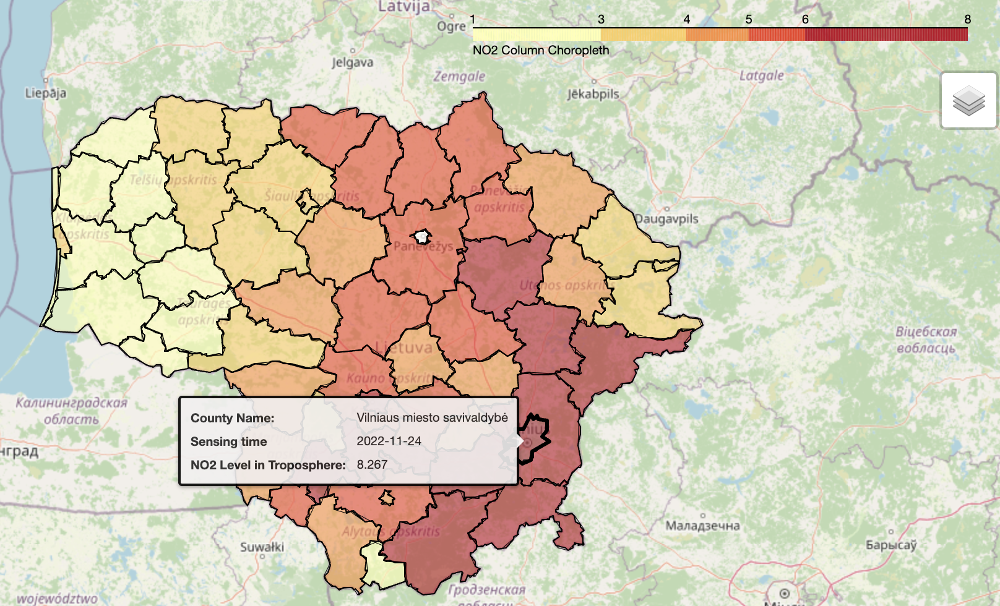